## **ResNet50**


In [1]:
import pandas as pd
import random
from sklearn import preprocessing
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import glob
import os
import cv2
import numpy as np
from sklearn.preprocessing import MinMaxScaler, StandardScaler
from numpy import expand_dims, argmax
import keras
import tensorflow as tf
from keras.applications.vgg16 import VGG16
from tensorflow.keras.applications import resnet50, inception_v3, vgg16
from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow import keras
from keras import optimizers
from keras.layers import Conv2D, MaxPooling2D, Activation, Dropout, Flatten, Dense, GlobalMaxPooling2D, BatchNormalization
from tensorflow.keras.optimizers import SGD, Adam, RMSprop
from keras.models import Sequential, load_model, Model
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint
from tensorflow.keras.utils import to_categorical
import seaborn as sns
from sklearn.metrics import classification_report, confusion_matrix
from tensorflow.keras.applications import EfficientNetB0, EfficientNetB4
from sklearn.metrics import roc_curve, auc, accuracy_score
from sklearn.multiclass import OneVsRestClassifier
from sklearn.preprocessing import label_binarize

scaler = MinMaxScaler()

%matplotlib inline

In [2]:
import random
fname = os.listdir('/kaggle/input/animal-data-vgg-data/Data')
random.shuffle(fname)
# print(fname)
img_files = []
for filename in fname:
  if filename.endswith(".JPG"):
    img_files.append(filename)
print(img_files)


['deer-img75.JPG', 'hare-img38.JPG', 'hare-img41.JPG', 'hare-img11.JPG', 'badger-img90.JPG', 'fox-img46.JPG', 'hare-img88.JPG', 'hare-img14.JPG', 'hare-img66.JPG', 'hare-img30.JPG', 'fox-img13.JPG', 'hare-img8.JPG', 'badger-img66.JPG', 'deer-img62.JPG', 'badger-img58.JPG', 'fox-img34.JPG', 'hare-img62.JPG', 'hare-img32.JPG', 'fox-img25.JPG', 'fox-img90.JPG', 'deer-img77.JPG', 'hare-img74.JPG', 'fox-img95.JPG', 'deer-img85.JPG', 'deer-img31.JPG', 'deer-img39.JPG', 'badger-img54.JPG', 'fox-img82.JPG', 'deer-img1.JPG', 'badger-img16.JPG', 'badger-img9.JPG', 'hare-img3.JPG', 'deer-img57.JPG', 'badger-img63.JPG', 'fox-img83.JPG', 'badger-img89.JPG', 'hare-img44.JPG', 'hare-img99.JPG', 'hare-img89.JPG', 'hare-img76.JPG', 'badger-img75.JPG', 'fox-img47.JPG', 'badger-img28.JPG', 'deer-img56.JPG', 'deer-img40.JPG', 'fox-img66.JPG', 'deer-img36.JPG', 'badger-img33.JPG', 'badger-img70.JPG', 'deer-img32.JPG', 'fox-img72.JPG', 'deer-img89.JPG', 'fox-img91.JPG', 'fox-img38.JPG', 'deer-img81.JPG', 'f

In [3]:
label = []
for label_path in img_files:
    label_p = label_path.split('.')[0]
    label_path = '/kaggle/input/animal-data-vgg-data/Data/'+label_p + '.txt'
    label_file = open(label_path, 'r')
    label_text = label_file.read().strip().split()
    class_label = int(label_text[0])
    label.append(class_label)
print(label)


[1, 3, 3, 3, 0, 2, 3, 3, 3, 3, 2, 3, 0, 1, 0, 2, 3, 3, 2, 2, 1, 3, 2, 1, 1, 1, 0, 2, 1, 0, 0, 3, 1, 0, 2, 0, 3, 3, 3, 3, 0, 2, 0, 1, 1, 2, 1, 0, 0, 1, 2, 1, 2, 2, 1, 2, 1, 1, 1, 1, 0, 1, 1, 3, 2, 2, 0, 0, 1, 1, 3, 2, 0, 3, 2, 0, 1, 3, 3, 2, 0, 3, 2, 2, 2, 1, 0, 2, 0, 1, 2, 0, 0, 3, 0, 1, 3, 2, 2, 0, 3, 2, 1, 1, 1, 1, 2, 2, 0, 1, 0, 1, 2, 2, 3, 3, 3, 3, 2, 2, 2, 0, 3, 1, 0, 0, 2, 2, 3, 2, 3, 1, 1, 2, 3, 0, 2, 2, 2, 2, 2, 1, 1, 1, 3, 0, 3, 1, 1, 1, 1, 3, 3, 2, 0, 0, 1, 1, 3, 0, 1, 0, 2, 3, 2, 3, 2, 1, 0, 1, 2, 1, 1, 3, 3, 0, 0, 0, 1, 3, 0, 1, 0, 0, 2, 2, 0, 1, 2, 3, 0, 1, 0, 3, 0, 3, 0, 3, 3, 3, 2, 2, 0, 1, 1, 2, 1, 0, 1, 1, 0, 1, 1, 3, 1, 0, 0, 0, 2, 3, 3, 2, 3, 1, 2, 3, 0, 2, 2, 2, 1, 3, 1, 0, 0, 1, 3, 3, 2, 3, 3, 2, 2, 0, 0, 0, 0, 2, 0, 2, 0, 2, 3, 0, 3, 1, 0, 3, 1, 2, 3, 1, 2, 0, 0, 0, 3, 2, 2, 1, 0, 0, 3, 1, 3, 0, 3, 0, 1, 1, 0, 0, 0, 2, 3, 2, 3, 2, 1, 3, 3, 0, 0, 0, 1, 0, 3, 2, 3, 0, 3, 3, 0, 2, 0, 0, 3, 3, 0, 3, 1, 1, 1, 3, 1, 3, 2, 3, 2, 1, 3, 2, 2, 0, 2, 2, 0, 1, 1, 3, 1, 0, 0, 

In [4]:
X = []
Y = []
for img in img_files:
    img_path = '/kaggle/input/animal-data-vgg-data/Data/' + img
    img = cv2.imread(img_path, cv2.IMREAD_COLOR)
    resized_img = cv2.resize(img, (256, 256), interpolation = cv2.INTER_CUBIC)
    X.append(resized_img)

Y = label

In [5]:
X = np.array(X)
Y = np.array(Y)

print(X.shape, Y.shape)

(400, 256, 256, 3) (400,)


In [6]:
X = X.astype('float32')
X /= 255.
Y = Y.reshape(Y.shape[0],1)
print(X.shape, Y.shape)

(400, 256, 256, 3) (400, 1)


In [9]:
train_X, val_X, train_Y, val_Y = train_test_split(X, Y, test_size = 0.04)
train_X, test_X, train_Y, test_Y = train_test_split(train_X, train_Y, test_size = 0.05)

In [10]:
print("Train X: {0}, Train Y: {1}".format(train_X.shape, train_Y.shape))
print("Val X: {0}, Val Y: {1}".format(val_X.shape, val_Y.shape))
print("Test X: {0}, Test Y: {1}".format(test_X.shape, test_Y.shape))

Train X: (364, 256, 256, 3), Train Y: (364, 1)
Val X: (16, 256, 256, 3), Val Y: (16, 1)
Test X: (20, 256, 256, 3), Test Y: (20, 1)


In [11]:
train_Y = to_categorical(train_Y, num_classes = 4)
val_Y = to_categorical(val_Y, num_classes = 4)
# test_Y = to_categorical(test_Y, num_classes = 4)

print("Shape: {0}, {1}".format(train_Y.shape, val_Y.shape))

Shape: (364, 4), (16, 4)


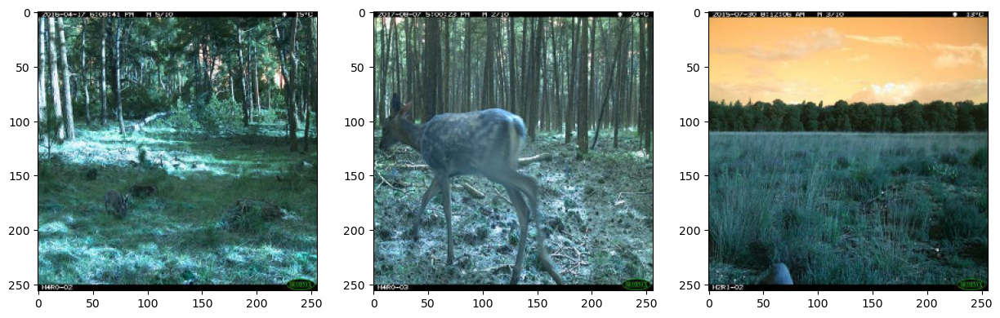

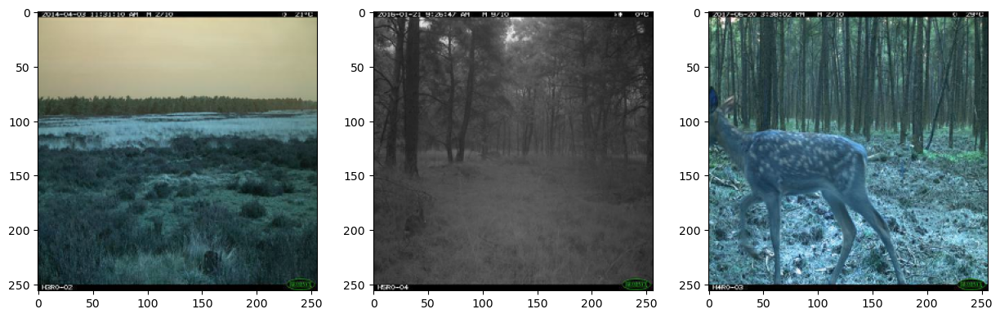

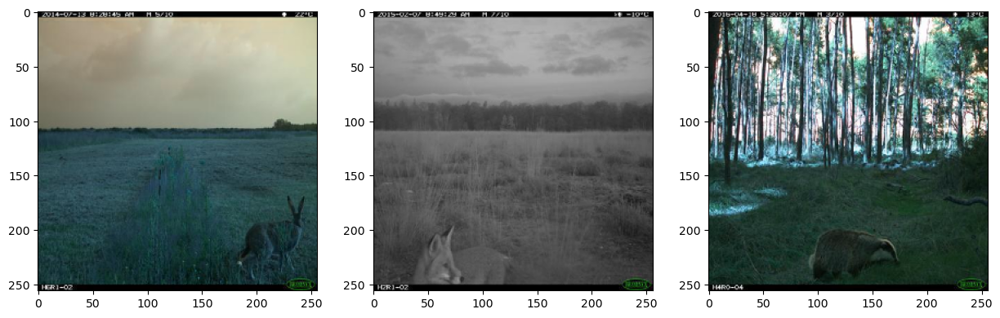

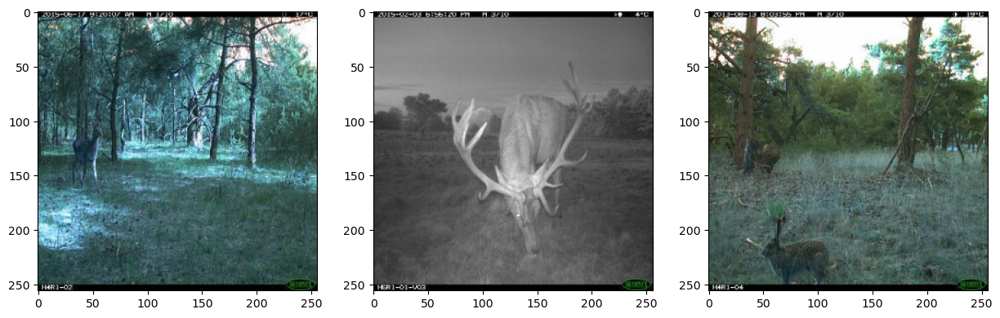

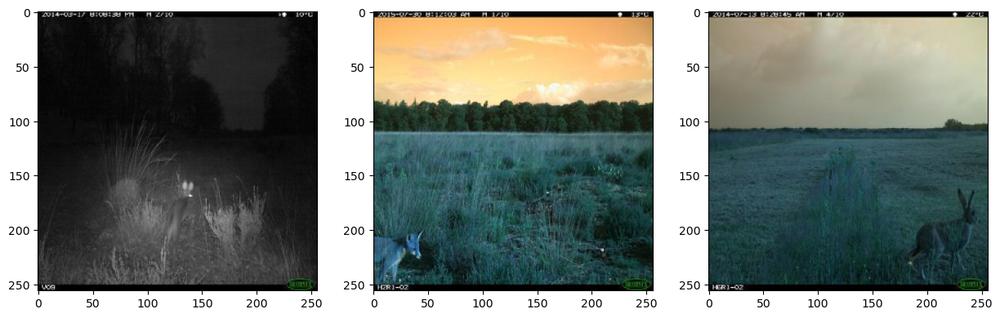

...

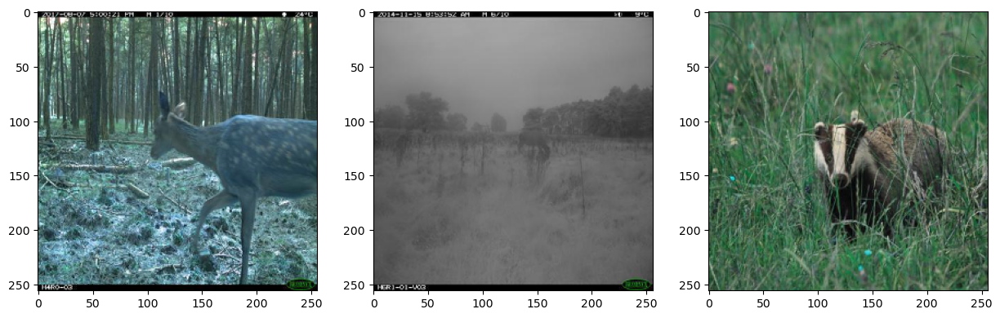

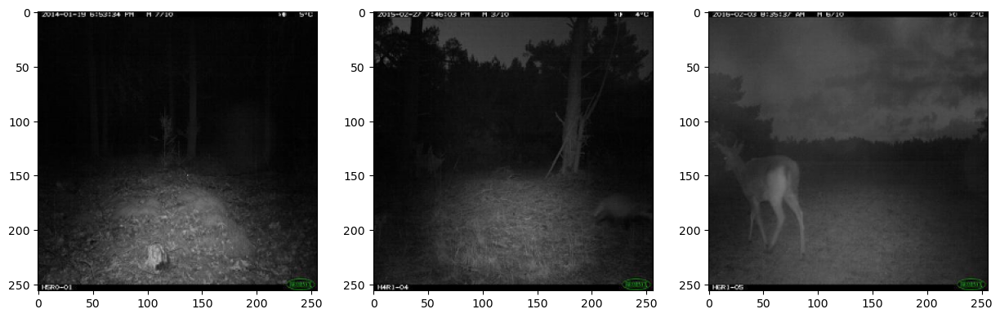

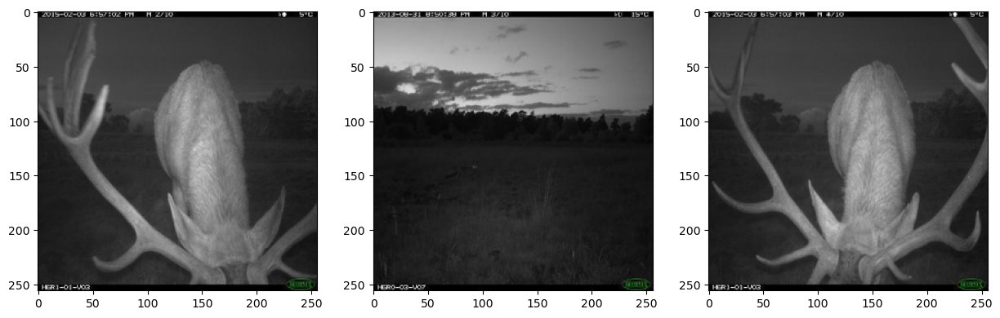

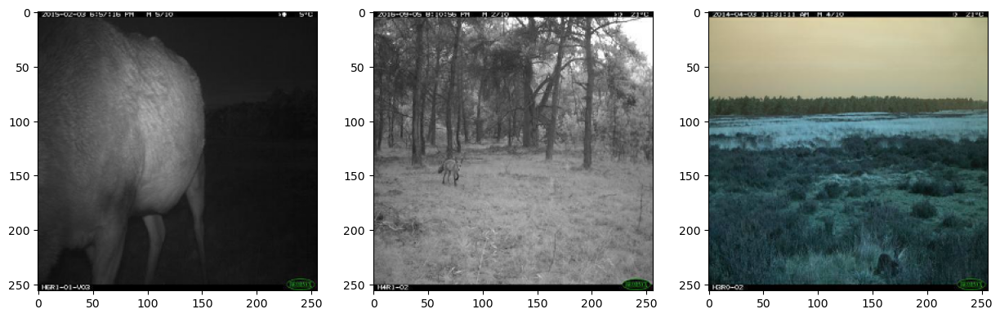

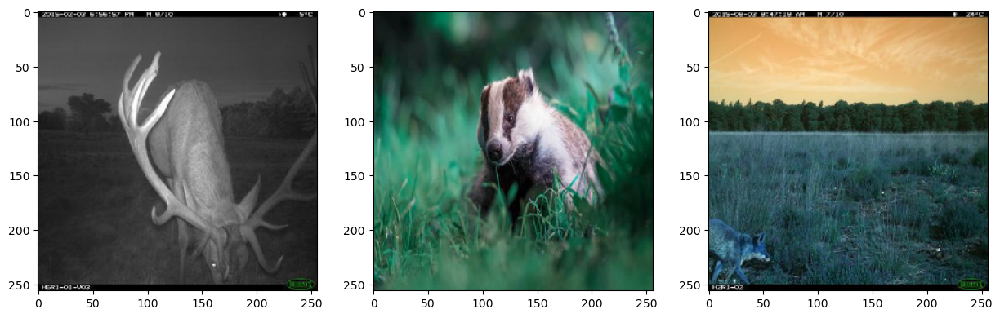

In [12]:
rows = 36
columns = 3
count = 1
for image_number in range(0,50, 3):

    fig = plt.figure(figsize=(15,15))

    fig.add_subplot(rows, columns, count)
    plt.subplot(1,3,1)
    plt.imshow(np.squeeze(train_X[image_number:image_number+1]))

    fig.add_subplot(rows, columns, count+1)
    plt.subplot(1,3,2)
    plt.imshow(np.squeeze(train_X[image_number+1:image_number+2]))

    fig.add_subplot(rows, columns, count+2)
    plt.subplot(1,3,3)
    plt.imshow(np.squeeze(train_X[image_number+2:image_number+3]))

    count += 3

In [13]:
data_generation = ImageDataGenerator(
    rotation_range = 7,  # randomly rotate images in the range (degrees, 0 to 180)
    width_shift_range = 0.10,  # randomly shift images horizontally (fraction of total width)
    height_shift_range = 0.10,  # randomly shift images vertically (fraction of total height)
    horizontal_flip = True,  # randomly flip images
    vertical_flip = True,   # randomly flip images
    fill_mode = 'reflect')  
data_generation.fit(train_X)

In [14]:
def plot_accuracy_loss(history):
    """
        Plot the accuracy and the loss during the training of the nn.
    """
    fig = plt.figure(figsize=(10,5))

    # Plot accuracy
    plt.subplot(221)
    plt.plot(history.history['acc'], label = "acc")
    plt.plot(history.history['val_acc'], label = "val_acc")
    plt.title("train_acc vs val_acc")
    plt.ylabel("accuracy")
    plt.xlabel("epochs")
    plt.legend()

    # Plot loss function
    plt.subplot(222)
    plt.plot(history.history['loss'], label = "loss")
    plt.plot(history.history['val_loss'], label = "val_loss")
    plt.title("train_loss vs val_loss")
    plt.ylabel("loss")
    plt.xlabel("epochs")

    plt.legend()
    plt.show()

In [15]:
def make_predictions(model, test_X, test_Y):
    test_loss = model.evaluate(test_X, test_Y)
    predictions = model.predict(test_X)
    pred_labels = np.argmax(predictions, axis = 1)
    test_labels = np.argmax(test_Y, axis = 1)
    return pred_labels, test_labels

In [16]:
def plot_confusion_matrix(test_labels, pred_labels):
    Y_test_actual = test_labels
    Y_test_pred = pred_labels
    confusion_mtx = confusion_matrix(Y_test_actual, Y_test_pred) 

    f,ax = plt.subplots(figsize = (8, 8))
    sns.heatmap(confusion_mtx, annot = True, linewidths = 0.01, cmap = "Greens", linecolor = "gray", fmt = '.1f', ax = ax)
    plt.xlabel("Predicted Label")
    plt.ylabel("True Label")
    plt.title("Confusion Matrix")
    plt.show()

In [17]:
def print_classification_report(test_labels, pred_labels):
    print("Classification Report: ")
    print(classification_report(test_labels, pred_labels))

In [18]:
ResNet50_model = keras.applications.resnet50.ResNet50()
image_size = 256
input_shape = (image_size, image_size, 3)

pre_trained_model_finetuning = ResNet50(input_shape=input_shape, include_top=False, weights="imagenet")
pre_trained_model_finetuning.trainable = True

94765736/94765736 [==============================] - 0s 0us/step


In [19]:
last_layer = pre_trained_model_finetuning.get_layer('conv5_block3_out')
last_output = last_layer.output

x = GlobalMaxPooling2D()(last_output)
x = Dense(64, activation = 'relu')(x)
x = Dropout(0.2)(x)

x = Dense(128, activation = 'relu')(x)
x = Dropout(0.2)(x)

x = Dense(256, activation = 'relu')(x)
x = Dropout(0.2)(x)

x = Dense(512, activation = 'relu')(x)
x = Dropout(0.2)(x)

x = keras.layers.Dense(4, activation = 'softmax')(x)

ResNet50_finetuning_bs8 = Model(pre_trained_model_finetuning.input, x)

ResNet50_finetuning_bs8.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['input_2[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

In [20]:
# # checkpoint: save best model during the training 
filepath = "./ResNet50-50epochs-bs8-run2"
checkpoint = ModelCheckpoint(filepath, monitor = 'val_acc', verbose = 1, save_best_only = True, mode = 'max')
callbacks_list = [checkpoint]

# initiate RMSprop optimizer
opt = keras.optimizers.RMSprop(learning_rate = 0.0001)

# Let's train the model using RMSprop
ResNet50_finetuning_bs8.compile(loss = 'categorical_crossentropy', optimizer = opt, metrics = ['acc']) 

In [21]:
history_ResNet50_finetuning_bs8 = ResNet50_finetuning_bs8.fit(data_generation.flow(train_X, train_Y, batch_size = 8),
                                steps_per_epoch = train_X.shape[0] // 8,
                                epochs = 50,
                                validation_data = (val_X, val_Y),
                                callbacks = [callbacks_list]
                                )

Epoch 1/50
45/45 [==============================] - ETA: 0s - loss: 1.9373 - acc: 0.2669
Epoch 1: val_acc improved from -inf to 0.37500, saving model to ./ResNet50-50epochs-bs8-run2
45/45 [==============================] - 74s 833ms/step - loss: 1.9373 - acc: 0.2669 - val_loss: 1.3336 - val_acc: 0.3750
Epoch 2/50
45/45 [==============================] - ETA: 0s - loss: 1.3182 - acc: 0.3848
Epoch 2: val_acc did not improve from 0.37500
45/45 [==============================] - 8s 165ms/step - loss: 1.3182 - acc: 0.3848 - val_loss: 1.5375 - val_acc: 0.1250
Epoch 3/50
45/45 [==============================] - ETA: 0s - loss: 1.1957 - acc: 0.4607
Epoch 3: val_acc did not improve from 0.37500
45/45 [==============================] - 7s 152ms/step - loss: 1.1957 - acc: 0.4607 - val_loss: 1.7676 - val_acc: 0.1250
Epoch 4/50
45/45 [==============================] - ETA: 0s - loss: 0.9656 - acc: 0.5815
Epoch 4: val_acc did not improve from 0.37500
45/45 [==============================] - 7s 159ms

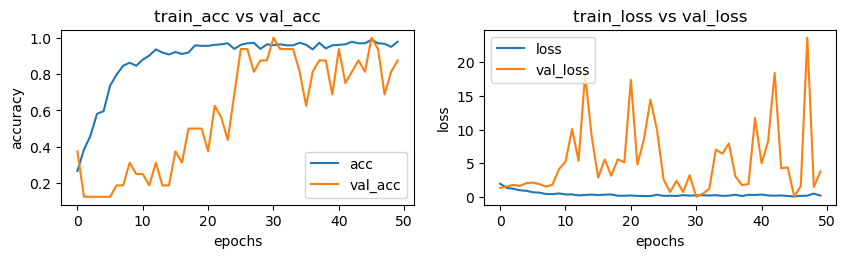

In [24]:
plot_accuracy_loss(history_ResNet50_finetuning_bs8)
# pred_labels, test_labels = make_predictions(ResNet50_finetuning_bs8, test_X, test_Y)
# print("Predictions: ", pred_labels)
# print("Actual: ", test_labels)
# plot_confusion_matrix(test_labels, pred_labels)
# print_classification_report(test_labels, pred_labels)

**Testing on actual test data**

In [25]:
fname = os.listdir('/kaggle/input/animal-data-vgg-data/test')
random.shuffle(fname)

test_files = []
for filename in fname:
  if filename.endswith(".JPG"):
    test_files.append(filename)
print(test_files)


['deer-img25.JPG', 'IMG_0673.JPG', 'IMG_0768.JPG', 'IMG_0328.JPG', 'IMG_0014.JPG', 'IMG_1842.JPG', 'IMG_0326.JPG', 'deer-img23.JPG', 'IMG_1844.JPG', 'IMG_1783.JPG', 'IMG_0913.JPG', 'deer-img26.JPG', 'IMG_0773.JPG', 'IMG_0717.JPG', 'IMG_0383.JPG', 'IMG_1833.JPG', 'IMG_0914.JPG', 'deer-img29.JPG', 'IMG_0684.JPG', 'IMG_0746.JPG', 'IMG_0136.JPG', 'IMG_1831.JPG', 'IMG_0444.JPG', 'IMG_0111.JPG', 'IMG_0112.JPG', 'IMG_0446.JPG', 'IMG_0685.JPG', 'IMG_0330.JPG', 'IMG_0381.JPG', 'IMG_0916.JPG', 'IMG_0671.JPG', 'IMG_0382.JPG', 'deer-img33.JPG', 'deer-img3.JPG', 'IMG_0683.JPG', 'IMG_0672.JPG', 'IMG_0324.JPG', 'IMG_0114.JPG', 'IMG_0912.JPG', 'IMG_0686.JPG', 'IMG_0915.JPG', 'IMG_1781.JPG', 'IMG_0911.JPG', 'IMG_0327.JPG', 'deer-img34.JPG', 'IMG_0449.JPG', 'IMG_0384.JPG', 'IMG_1782.JPG', 'IMG_0323.JPG', 'IMG_0325.JPG', 'deer-img31.JPG', 'IMG_1841.JPG', 'deer-img20.JPG', 'IMG_0670.JPG', 'IMG_0448.JPG', 'IMG_0447.JPG', 'IMG_1784.JPG', 'IMG_1785.JPG', 'IMG_0329.JPG', 'IMG_1834.JPG', 'deer-img27.JPG', 'IMG

In [26]:
test_label = []
for label_path in test_files:
    label_p = label_path.split('.')[0]
    label_path = '/kaggle/input/animal-data-vgg-data/label/'+label_p + '.txt'
    label_file = open(label_path, 'r')
    label_text = label_file.read().strip().split()
    class_label = int(label_text[0])
    if class_label == 0:
        class_label = 1
    elif class_label == 1:
        class_label = 0
    test_label.append(class_label)
print(test_label)

[1, 2, 2, 3, 2, 0, 3, 1, 0, 0, 2, 1, 2, 2, 3, 0, 2, 1, 2, 2, 3, 0, 3, 2, 2, 3, 2, 3, 3, 2, 2, 3, 1, 1, 2, 2, 3, 2, 2, 2, 2, 0, 2, 3, 1, 3, 3, 0, 3, 3, 1, 0, 1, 2, 3, 3, 0, 0, 3, 0, 1, 0, 3, 2, 1, 3, 0]


In [27]:
assert(len(test_files) == len(test_label))

In [28]:
test_dataset = []
actual_label = []
for img in test_files:
    img_path = '/kaggle/input/animal-data-vgg-data/test/' + img
    img = cv2.imread(img_path, cv2.IMREAD_COLOR)
    resized_img = cv2.resize(img, (256, 256), interpolation = cv2.INTER_CUBIC)
    test_dataset.append(resized_img)

actual_label = test_label

In [29]:
test_dataset = np.array(test_dataset)
actual_label = np.array(actual_label)

print(test_dataset.shape, actual_label.shape)

(67, 256, 256, 3) (67,)


In [30]:
test_dataset = test_dataset.astype('float32')
test_dataset /= 255.
actual_label = actual_label.reshape(actual_label.shape[0],1)
print(test_dataset.shape, actual_label.shape)

(67, 256, 256, 3) (67, 1)


In [31]:
actual_label = to_categorical(actual_label, num_classes = 4)

3/3 [==============================] - 1s 129ms/step
Predictions:  [1 2 0 3 2 0 3 1 0 0 2 1 2 2 2 0 2 1 2 2 0 0 2 2 2 2 2 3 2 2 2 2 1 1 2 2 3
 2 2 2 2 0 2 3 1 1 2 0 3 3 1 0 1 2 2 2 0 0 3 0 1 0 3 2 1 2 0]
Actual:  [1 2 2 3 2 0 3 1 0 0 2 1 2 2 3 0 2 1 2 2 3 0 3 2 2 3 2 3 3 2 2 3 1 1 2 2 3
 2 2 2 2 0 2 3 1 3 3 0 3 3 1 0 1 2 3 3 0 0 3 0 1 0 3 2 1 3 0]


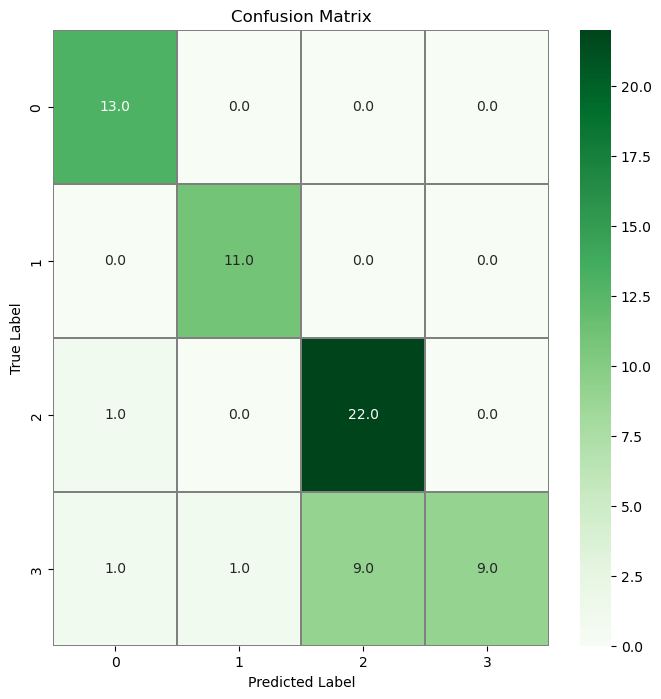

Classification Report: 
              precision    recall  f1-score   support

           0       0.87      1.00      0.93        13
           1       0.92      1.00      0.96        11
           2       0.71      0.96      0.81        23
           3       1.00      0.45      0.62        20

    accuracy                           0.82        67
   macro avg       0.87      0.85      0.83        67
weighted avg       0.86      0.82      0.80        67



In [32]:
pred_labels, actual_label = make_predictions(ResNet50_finetuning_bs8, test_dataset, actual_label)
print("Predictions: ", pred_labels)
print("Actual: ", actual_label)
plot_confusion_matrix(actual_label, pred_labels)
print_classification_report(actual_label, pred_labels)